# GANs: I'm Something of a Painter Myself

## Introduction:

The advancement in computer vision technology as allowed for generative adversarial networks (GANs), an advancement in generative modeling within deep learning, that help with image creation. In this mini-project, we aim to replicate the unique style of one of the most influential artists of all time. Oscar-Claude Monet was a French painter and founder of impressionist painting, who's paintings will be used as the training set for the algorithm. Our aim will be to trick classifiers into thinking that our generated paintings are actually Monet paintings. This notebook will go through the exploratory data analysis (EDA) procedure, model building and analysis, result, and discussion/conclusion. The data is received from the [Kaggle competition](https://www.kaggle.com/competitions/gan-getting-started) and the link to the project [GitHub Notebook.](https://github.com/aryanbashar/GANs_Monet_Paintings)

GANs can be used to teach about deep learning models and are made up of two parts, a generator and discriminator. The generator will create the fake images that look like the training images while the discriminator works to build its ability to tell the difference between fake and real images. It ideally gets to the point where the generator makes a perfect copy that leaves the discriminator with no choice but to guess the 50% chance.

PyTorch will be the framework for this project due to a few key factors. It is a user-friendly interface for building complex neural network architectures. It has a dynamic computation graph which can allow the change of the model architecture as you experiment. It also works well with GPUs for training, which is important for processing large amount of images. PyTorch also has a large library of model architectures and transformations available for use and a large community that develops the tools and libraries.

### Required Libraries:

In [ ]:
import os
import cv2
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
import shutil
import itertools
from torch.utils.data import Dataset, DataLoader
from tqdm.notebook import tqdm
import torch.optim as optim
import torch.nn as nn
import matplotlib.pyplot as plt
from torchvision import transforms
import torchvision
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings("ignore")

### Preparation:

This will define a class for a few required steps for loading in and processing the monet images and photo images. They are helpful for use with PyTorch's Dataset class. A custom Dataset class must implement three functions: __init__, __len__, and __getitem__. The init function initializes the directory containing the images and transforms. The init function returns the number of samples in the dataset. The len function provides the number of samples in the dataset. Finally, the getsimpleitem function is used just when we want to look at a specific photo.

In [ ]:
class MonetStyleDataset(Dataset):
    def __init__(self, directory_path, transform=None):
        self.directory_path = directory_path
        self.transform = transform
        self.images = [os.path.join(directory_path, f) for f in os.listdir(directory_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image_path = self.images[idx]
        try:
            image = Image.open(image_path).convert('RGB')
            if self.transform:
                image = self.transform(image)
            return image
        except Exception as e:
            print(f"Error loading image {image_path}: {e}")
            return None

    def __getsimpleitem__(self, idx):
        image_path = self.images[idx]
        image = Image.open(image_path).convert('RGB')
        return image

The device and tensor are to help with optimizing computations depending on if a GPU is available. The parameters are set for the model later in the notebook.
The transform module is for preprocessing the image data. Images will be resized to 256x256 pixels if needed and a Gaussian Blur is added, which can help with denoising. Tensor changes the images to PyTorch tensors and then they will be normalized to soothe the learning process.
The two datasets are also initialized with the MonetStyleDataset class from earlier.


In [ ]:
# Configuration to use GPU if available
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.Tensor

# Transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 3.)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
# Initialize datasets
monet_dataset = MonetStyleDataset('/kaggle/input/gan-getting-started/monet_jpg', transform)
photo_dataset = MonetStyleDataset('/kaggle/input/gan-getting-started/photo_jpg', transform)


# Initialize data loaders
load_monet = DataLoader(monet_dataset, batch_size=batch_size, shuffle=True)
load_photo = DataLoader(photo_dataset, batch_size=batch_size, shuffle=True)

In [ ]:
# Check the number of images in each dataset
print(f"Total images in Monet dataset: {len(monet_dataset)}")
print(f"Total images in Photo dataset: {len(photo_dataset)}")

Total images in Monet dataset: 300
Total images in Photo dataset: 7038


Check for an image in the dataset to make sure that data loaded correctly.

In [ ]:
# To check an image from the dataset to confirm that it loaded correctly

def test_images(n, dataset):
    transformed_image = dataset.__getitem__(n)
    simple_image  = dataset.__getsimpleitem__(n)

    transformed_img = np.squeeze(transformed_image)
    simple_img = np.squeeze(simple_image)

    f, axes = plt.subplots(1,2)

    for i in range(2):
        axes[i].axes.get_xaxis().set_visible(False)
        axes[i].axes.get_yaxis().set_visible(False)

    axes[1].imshow(transformed_img.permute(1, 2, 0))
    axes[0].imshow(simple_img)
    axes[1].set_title("Transformed image")
    axes[0].set_title("Original image")
    plt.show()

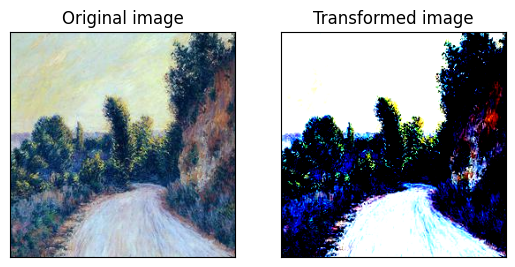

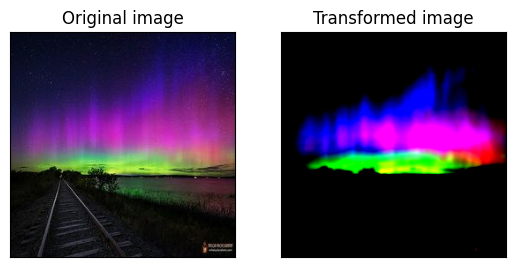

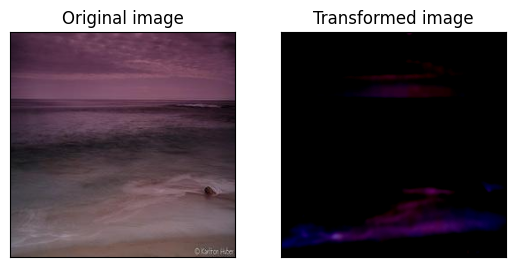

In [ ]:
# Visualize data augmentation in both datasets
test_images(n=89, dataset=monet_dataset)
test_images(n=234, dataset=photo_dataset)
test_images(n=56, dataset=photo_dataset)

In [ ]:
# Hyperparameters
batch_size = 12
learning_rate = 0.0002
beta1 = 0.55
beta2 = 0.995
n_epoches = 128
epoch_test = 16

## Model Building:

This puts together the Discriminator class, built using PyTorch's neural network module (nn.Module). This is the discriminator component of the Generative Adversarial Network which is required for telling apart real and generated images.
Layer Configuration:

1.	**Convolutional Layers:**
    - This layer is a 2D convolution that takes 3 input channels and puts out 64 feature maps. This will lower spatial dimension of the input and takes the low-level features.
    - The other convolutional layers increase the number of feature maps (64 ->128 -> 256 -> 512) and further lowers the spatial dimensions. The normalization and ReLU activations in between help with speeding up training while keeping it stable.
2.	**Convolutional Transpose Layers:**
    - The feature map that is now at 512, these transpose layers will increase the spatial dimensions while lowering depth as it goes down each step to 64 feature maps.
    - This will similarly have instance normalization and ReLU activations in between the layers. Upsampling is also found here, to process features at the different scales.
3.	**Final Layer:**
    - The final transposed convolution layer puts out one feature map with higher spatial dimensions, which will designate if the input image is fake or real.


In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.model = nn.Sequential(

            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1),
            nn.InstanceNorm2d(512),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(64, 1, kernel_size=3, stride=2, padding=1, output_padding=1)
        )

    def forward(self, x):
        return self.model(x)

The below is for the **ResidualBlock** class, which is an important part of deep learning networks, especially for image processing. It completes padding to add 1 pixel around the sides of an input tensor to reduce objects at the edges. There are further normalization and Rectified Linear Unit activation functions. The forward pass lets gradients flow straight through the networks, which can help deeper networks learn from the input better. Overall, it will help deepen the neural network and benefit model to extract more information.

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(256, 256, 3),
            nn.InstanceNorm2d(256)
        )

    def forward(self, x):
        return x + self.block(x)

The Generator class is another extremely important part of GANs, especially to create images that look like Monet paintings. The below has a common architecture that leads to a final image. As discussed earlier, it aims to trick the Discriminator with these created images.

1.	**Initial Convolution Block:**
    - The reflection padding will help sustain edge information by adding padding around the frame of the input.
    - The number of channels is boosted from 3 to 64 to help acquire early features.
    - Further normalization and ReLU activations as described before.
2.	**Downsampling Blocks:**
    - These two sets of convolution layers increased the depth of the feature maps (64 -> 128 -> 256) and halving the spatial dimension each step. It should hopefully grant the network the ability to gather higher-level features with less of a performance cost.
3.	**Residual Blocks:**
    - This provides the network with an identity function, so that it can generate useful features throughout layers without deprivation.
4.	**Upsampling Blocks:**
    - The transposed convolutions would double the spatial dimensions of the feature maps while lowering depth.
5.	**Output Block:**
    - More reflection padding and returns the channel count back to 3 for a RBG image output.
    - Tanh activation normalizes the output pixel values to -1,1. This is general in GANs as it corresponds the anticipated distribution of the image data.


In [ ]:
class Generator(nn.Module):
    def __init__(self, residual_blocks=9):
        super(Generator, self).__init__()

        self.initial = nn.Sequential(

            nn.ReflectionPad2d(3),
            nn.Conv2d(3, 64, 7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.downsample_blocks = nn.Sequential(

            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )

        self.residual_blocks = nn.Sequential(*[ResidualBlock() for _ in range(residual_blocks)])

        self.upsample_blocks = nn.Sequential(

            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)

        )

        self.output = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, 3, 2 * 3 + 1),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.initial(x)
        x = self.downsample_blocks(x)
        x = self.residual_blocks(x)
        x = self.upsample_blocks(x)
        return self.output(x)

The Generator and Discriminator have an instance created below. The loop aims to check for a CUDA-capable GPU and moves the models to the GPU if available to speed up training through parallel processing. The loss functions define the Mean Squared Error loss and L1 loss. The MSE loss is important for checking GAN performance and measures how well the discriminator can tell between images and how well the generator performs to trick the discriminator. The L1 loss is for cycle consistency as it makes sure that inputed data should retuen back to the original data after going through the generator. The chosen optimizer for this model is Adam since it is quite successful at training deep neural networks.

In [ ]:
Gen = Generator()
Dis = Discriminator()

models = [Gen, Dis]
for model in models:
    if torch.cuda.is_available():
        model.cuda()

gan_loss = nn.MSELoss().cuda()
cycle_loss = nn.L1Loss().cuda()
identity_loss = nn.L1Loss().cuda()

In [ ]:
# Adam Optimizer, with the Learning Rate and Betas indicated above.
optimizer_Gen = torch.optim.Adam(Gen.parameters(), lr=learning_rate, betas=(beta1, beta2))
optimizer_Dis = torch.optim.Adam(Dis.parameters(), lr=learning_rate, betas=(beta1, beta2))

This will create a grid of photos that show the real and generated images. It will show the ability of the Generator even prior to the training process.

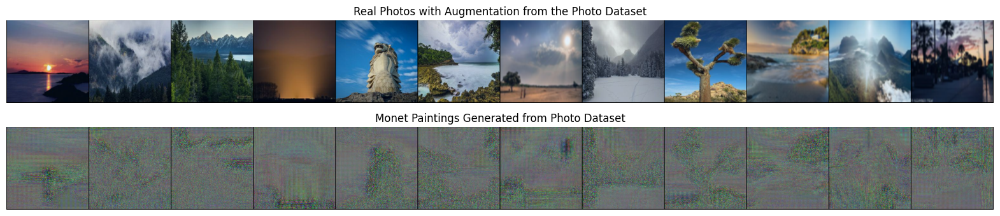

In [ ]:
def test_augmented_images(real_X):

    Gen.eval()

    real_picture = real_X.type(Tensor)
    artificial_picture = Gen(real_X).detach()

    ncols = real_X.size(0)
    real_picture_grid = make_grid(real_picture, nrow=ncols, normalize=True)
    artificial_picture_grid = make_grid(artificial_picture, nrow=ncols, normalize=True)

    f, axes = plt.subplots(2, 1, figsize=(20, 4))

    axes[0].imshow(real_picture_grid.permute(1, 2, 0).cpu())
    axes[0].set_title("Real Photos with Augmentation from the Photo Dataset")
    axes[0].axis('off')

    axes[1].imshow(artificial_picture_grid.permute(1, 2, 0).cpu())
    axes[1].set_title("Monet Paintings Generated from Photo Dataset")
    axes[1].axis('off')

    plt.show()

real_X = next(iter(load_photo))
real_Y = next(iter(load_photo))
test_augmented_images(real_X.to(device))

## Model Training:

This is the typical training loop for a Generative Adversarial Network (GAN) which transforms images to make them look similar to Monet's paintings. It is done over the training epochs established earlier in the notebook (128 epochs). It will iterate over the batch size of 12 from the real photos and Monet paintings. This is important for both training and the Discriminator so that it can tell which are real and which are generated.

The training data is converted to the correct tensor type and labels are set and 'valid' and 'fake', which are matched to the Discriminator's output shape.

**Generator Training**
1. Identity Loss: Measures how the generator output is different from the input.
2. GAN Loss: Measures how well the generator is performing, by tricking the discriminator.
3. Total Generator Loss: A weighted sum of identity and GAN Loss.

**Discriminator Training**
1. Real Loss: Measures the discriminator's ability to tell which paintings are real Monet.
2. Fake Loss: Measures the discriminator's ability to tell which paintings are fake Monet.
3. Total Discriminator Loss: The average of real and fake losses.

The code will show examples of the images generated every 16 epochs and will provide the Generator Loss and Discriminator Loss to review.


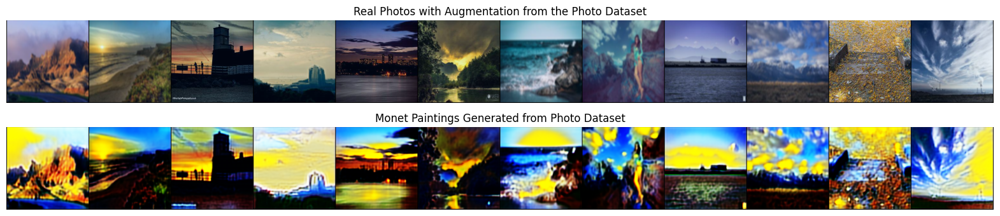

Epoch 16 | 128
Generator loss: 3.672978162765503 =  2.682175040245056 (5 * identity loss) + 0.9908029437065125 (GAN loss)
Discriminator loss: 0.14182767271995544 = 0.13100039958953857 (real monet loss/2)  + 0.021654531359672546 (generated monet loss/2)


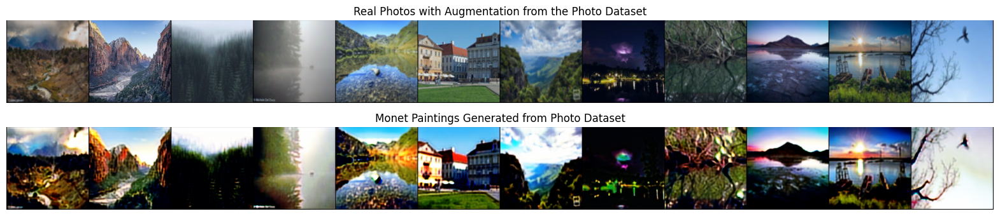

Epoch 32 | 128
Generator loss: 3.0006027221679688 =  2.093377858400345 (5 * identity loss) + 0.9072247743606567 (GAN loss)
Discriminator loss: 0.006688675377517939 = 0.002326198387891054 (real monet loss/2)  + 0.008724953979253769 (generated monet loss/2)


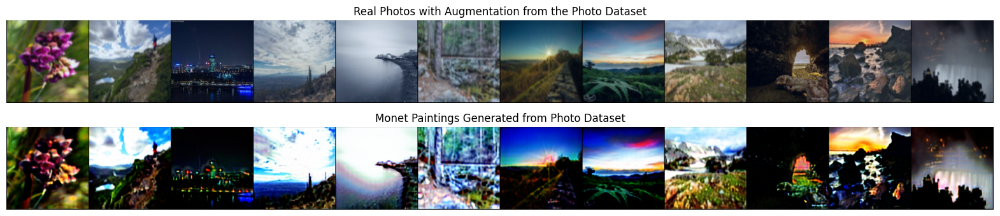

Epoch 48 | 128
Generator loss: 3.0712413787841797 =  2.118476927280426 (5 * identity loss) + 0.9527645111083984 (GAN loss)
Discriminator loss: 0.00525988545268774 = 0.0018999673193320632 (real monet loss/2)  + 0.006719836499541998 (generated monet loss/2)


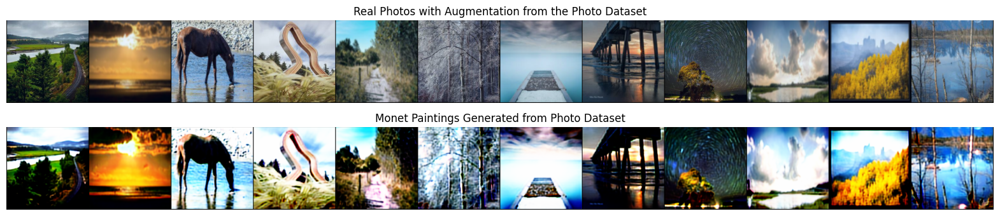

Epoch 64 | 128
Generator loss: 3.1403698921203613 =  2.151768207550049 (5 * identity loss) + 0.988601565361023 (GAN loss)
Discriminator loss: 0.005096028093248606 = 0.0026465195696800947 (real monet loss/2)  + 0.004899017047137022 (generated monet loss/2)


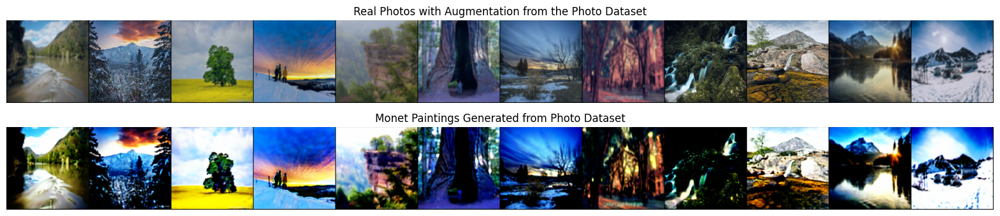

Epoch 80 | 128
Generator loss: 2.9214022159576416 =  1.9454935193061829 (5 * identity loss) + 0.9759086966514587 (GAN loss)
Discriminator loss: 0.001152463024482131 = 0.00042465043952688575 (real monet loss/2)  + 0.0014556252863258123 (generated monet loss/2)


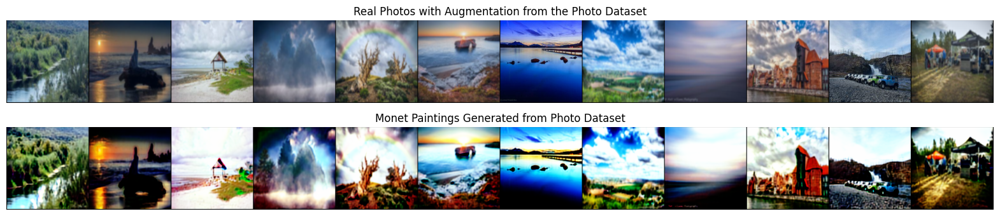

Epoch 96 | 128
Generator loss: 2.688417434692383 =  1.740942895412445 (5 * identity loss) + 0.9474743604660034 (GAN loss)
Discriminator loss: 0.02384517341852188 = 0.018511828035116196 (real monet loss/2)  + 0.010666688904166222 (generated monet loss/2)


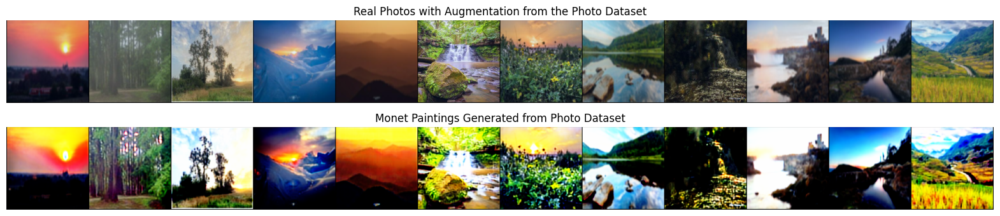

Epoch 112 | 128
Generator loss: 3.0391604900360107 =  2.0268480479717255 (5 * identity loss) + 1.012312412261963 (GAN loss)
Discriminator loss: 0.0006548943929374218 = 0.00031761807622388005 (real monet loss/2)  + 0.0006745526334270835 (generated monet loss/2)


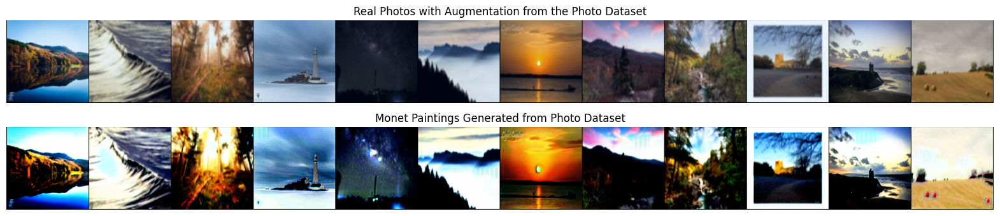

Epoch 128 | 128
Generator loss: 2.807614326477051 =  1.9330483675003052 (5 * identity loss) + 0.874565839767456 (GAN loss)
Discriminator loss: 0.022799866273999214 = 0.0016621010145172477 (real monet loss/2)  + 0.042275529354810715 (generated monet loss/2)


In [ ]:
#Training Loop Structure
for epoch in range(n_epoches):
    for i, (real_photo, real_monet) in enumerate(zip(load_photo, load_monet)):

        # Preparing Training Data
        real_photo = real_photo.type(Tensor)
        real_monet = real_monet.type(Tensor)

        out_shape = [real_photo.size(0), 1, real_photo.size(2) , real_photo.size(3)]

        valid = torch.ones(out_shape).type(Tensor)
        fake = torch.zeros(out_shape).type(Tensor)

        # Generator Training
        Gen.train()
        optimizer_Gen.zero_grad()
        artificial_monet = Gen(real_photo)

        # Identity Loss: Measures how the generator output is different from its input
        loss_identity = identity_loss(artificial_monet, real_photo)

        # GAN Loss: Measures how well the generator tricks the discriminator
        loss_GAN = gan_loss(Dis(artificial_monet), valid)

        # Total Generator Loss: Weighted sum of the identity and GAN loss
        loss_G = 5.0 * loss_identity + loss_GAN

        loss_G.backward()
        optimizer_Gen.step()

        # Discriminator Training
        optimizer_Dis.zero_grad()

        # Real Loss: Measures the discriminator's ability to identify real Monet paintings
        loss_real = gan_loss(Dis(real_monet), valid)

        # Fake Loss: Measures the discriminator's ability to identify fake Monet paintings
        loss_fake = gan_loss(Dis(artificial_monet.detach()), fake)

        # Total Discriminator Loss: Average of real and fake losses, used to update the discriminator
        loss_D = (loss_real + loss_fake) / 2

        loss_D.backward()
        optimizer_Dis.step()

    # Results of the Samples
    if (epoch + 1) % epoch_test == 0:
        test_real_photo, test_real_monet = next(iter(zip(load_photo, load_monet)))
        test_augmented_images(test_real_photo.type(Tensor))

        print(f'Epoch {epoch + 1} | {n_epoches}')
        print(f'Generator loss: {loss_G.item()}')
        print(f'Discriminator loss: {loss_D.item()}')

### Tuning:

We can see that the final Generator Loss was about 2.808 and the Discriminator Loss was 0.0228. Let us see if we can improve on this by adjusting the parameters. A increase in batch size should allow the model to learn at a more stable pace and may lead to smoother training curves, but we should be careful in reducing noise. Learning rate was increased just slightly to speed up how fast the model learns. The Beta1 (Momentum term in Adam Optimizer) was decreased to allow the optimizer to react better to new changes, and when the landscape of the loss functions changes quickly. The Beta2 (RMSprop term in Adam Optimizer was increased, which can make the convergence more stable, even though it could be slower. The optimizer overall should be better at reacting to changes.

In [ ]:
# Hyperparameters
batch_size = 24
learning_rate = 0.0003
beta1 = 0.50
beta2 = 0.999
n_epoches = 128
epoch_test = 16

In [ ]:
# Adam Optimizer, with the Learning Rate and Betas indicated above.
optimizer_Gen = torch.optim.Adam(Gen.parameters(), lr=learning_rate, betas=(beta1, beta2))
optimizer_Dis = torch.optim.Adam(Dis.parameters(), lr=learning_rate, betas=(beta1, beta2))

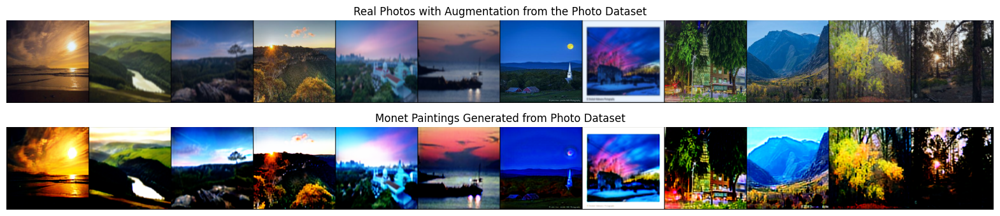

Epoch 16 | 128
Generator loss: 3.0171990394592285
Discriminator loss: 0.001617151196114719


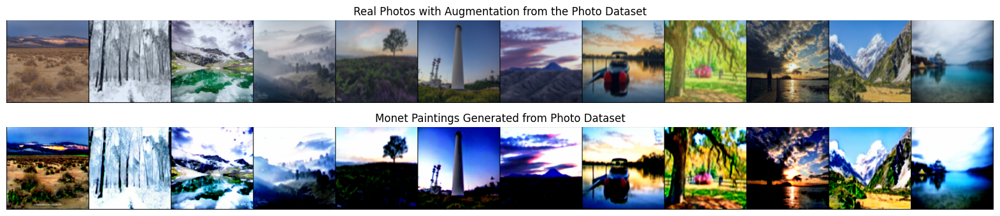

Epoch 32 | 128
Generator loss: 2.9114186763763428
Discriminator loss: 0.00143114582169801


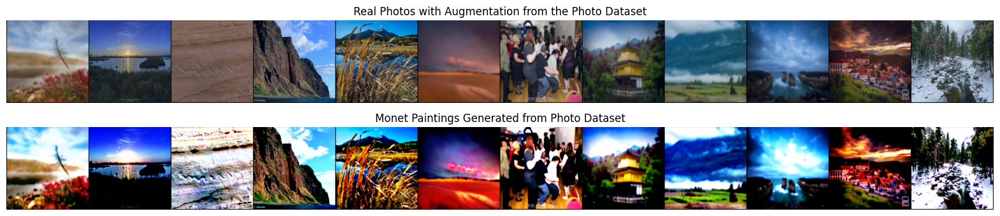

Epoch 48 | 128
Generator loss: 2.9583683013916016
Discriminator loss: 0.0003619738854467869


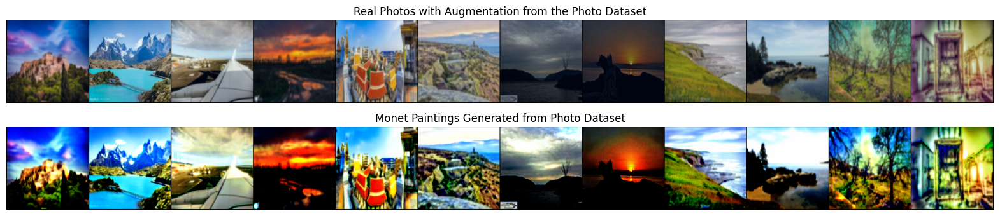

Epoch 64 | 128
Generator loss: 2.950277328491211
Discriminator loss: 0.001341940020211041


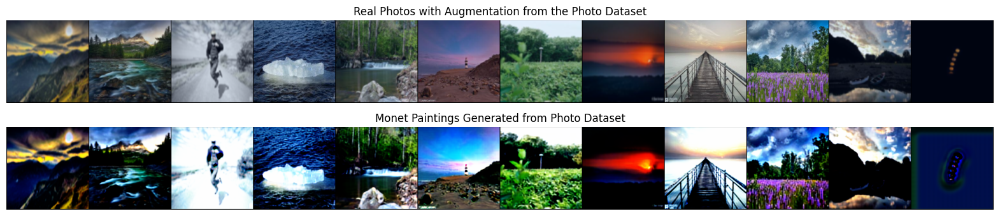

Epoch 80 | 128
Generator loss: 2.9314913749694824
Discriminator loss: 0.0003161576169077307


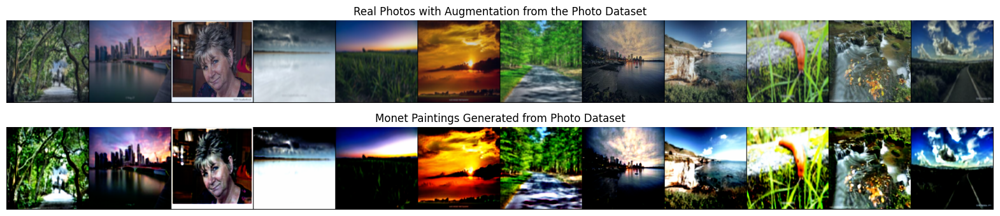

Epoch 96 | 128
Generator loss: 2.888554811477661
Discriminator loss: 0.0004057526821270585


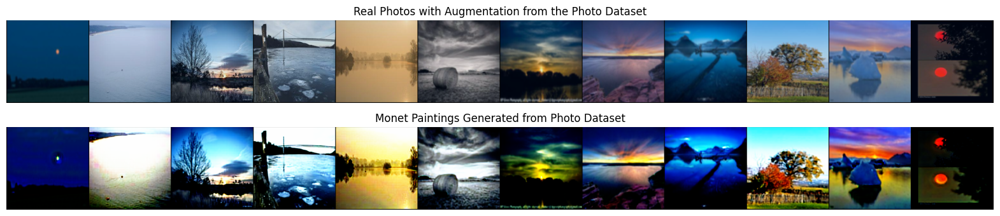

Epoch 112 | 128
Generator loss: 2.824521780014038
Discriminator loss: 0.0002971865760628134


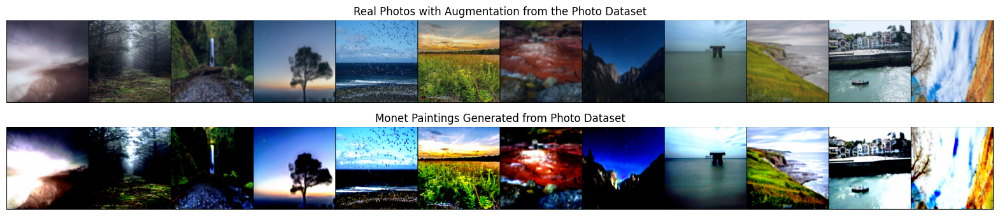

Epoch 128 | 128
Generator loss: 2.7086362838745117
Discriminator loss: 0.00014331724378280342


In [ ]:
#Training Loop Structure
for epoch in range(n_epoches):
    for i, (real_photo, real_monet) in enumerate(zip(load_photo, load_monet)):

        # Preparing Training Data
        real_photo = real_photo.type(Tensor)
        real_monet = real_monet.type(Tensor)

        out_shape = [real_photo.size(0), 1, real_photo.size(2) , real_photo.size(3)]

        valid = torch.ones(out_shape).type(Tensor)
        fake = torch.zeros(out_shape).type(Tensor)

        # Generator Training
        Gen.train()
        optimizer_Gen.zero_grad()
        artificial_monet = Gen(real_photo)

        # Identity Loss: Measures how the generator output is different from its input
        loss_identity = identity_loss(artificial_monet, real_photo)

        # GAN Loss: Measures how well the generator tricks the discriminator
        loss_GAN = gan_loss(Dis(artificial_monet), valid)

        # Total Generator Loss: Weighted sum of the identity and GAN loss
        loss_G = 5.0 * loss_identity + loss_GAN

        loss_G.backward()
        optimizer_Gen.step()

        # Discriminator Training
        optimizer_Dis.zero_grad()

        # Real Loss: Measures the discriminator's ability to identify real Monet paintings
        loss_real = gan_loss(Dis(real_monet), valid)

        # Fake Loss: Measures the discriminator's ability to identify fake Monet paintings
        loss_fake = gan_loss(Dis(artificial_monet.detach()), fake)

        # Total Discriminator Loss: Average of real and fake losses, used to update the discriminator
        loss_D = (loss_real + loss_fake) / 2

        loss_D.backward()
        optimizer_Dis.step()

    # Results of the Samples
    if (epoch + 1) % epoch_test == 0:
        test_real_photo, test_real_monet = next(iter(zip(load_photo, load_monet)))
        test_augmented_images(test_real_photo.type(Tensor))

        print(f'Epoch {epoch + 1} | {n_epoches}')
        print(f'Generator loss: {loss_G.item()}')
        print(f'Discriminator loss: {loss_D.item()}')

### Discussion:

The generator loss decreased in the secound model compared to the first model, which is about 2.709 in the second model and 2.808 in the second model. The generator should be better at tricking the discriminator in this case, and better at creating images that more closely resemble real Monet paintings. Likewise, the disrciminator loss is much lower in the second model compared to the first with about 0.00014 in the second model and about 0.0228 in the first model. This would mean that the discriminator is also performing better in differentiating between the real and fake images and would make it more confident in its predictions. The caveat is that a significantly lower discriminator loss may have an inbalance in GAN Dynamics. The discriminator may become too good early on and then the generator would not be able to keep up to learn as quickly. As a result, there could be potential for overfitting. We will test both on the unseen set to see how they perform. The first model might be more balanced, but the second one on paper should perform better. Next steps can look into adjusting training dynamics to avoid the potential for overfitting by temporarily making the discriminator slower at training.

## Conclusion:

This project looked to use Generative Adversarial Networks (GANs) to create images that replicate the unique style of Oscar-Claude Monet. The aim of this was to trick the classifiers into thinking that the generated images were actually the real Monet paintings. This process not only allowed for the increase in understanding of neural networks and their capabilities, but also push the envelope for what is capable with deep learning. This notebook went through the exploratory data analysis (EDA) procedure, model building and analysis, result, and discussion. Adjustments were made on the hyperparameters of the first model after loss levels were taken into account. The project was able to successfully use GANs to recreate the styles of renowned artists and their unique styles. There is an establishment of a relationship with artifical intelligence and art that can provide developments to an emerging technology. I have learned the significance of careful data preparation, especially when dealing with a specific type like paintings. Likewise, the importance of using a suitable model architecture and hyperparameters can greatly affect the performance and desired results.  

## References:

Amy Jang, Ana Sofia Uzsoy, Phil Culliton. (2020). I’m Something of a Painter Myself. Kaggle. https://kaggle.com/competitions/gan-getting-started

Paszke, A., Gross, S., Massa, F., Lerer, A., Bradbury, J., Chanan, G., Killeen, T., Lin, Z., Gimelshein, N., Antiga, L., Desmaison, A., Köpf, A., Yang, E., DeVito, Z., Raison, M., Tejani, A., Chilamkurthy, S., Steiner, B., Fang, L., . . . Chintala, S. (2019). PyTorch: An Imperative Style, High-Performance Deep Learning Library. *arXiv (Cornell University)*, 32, 8026–8037. https://arxiv.org/pdf/1912.01703.pdf

Programming with TensorFlow. (2021). In *EAI/Springer Innovations in Communication and Computing.* https://doi.org/10.1007/978-3-030-57077-4

*PyTorch documentation — PyTorch 2.2 documentation.* (n.d.). https://pytorch.org/docs/stable/index.html

### Kaggle Submission:

In [ ]:
# The path for sabing the images
transformed_save_dir = '../images'
if not os.path.exists(transformed_save_dir):
    os.makedirs(transformed_save_dir)

Gen.eval()

for i, real_photos in enumerate(load_photo):
    real_photos = real_photos.to(device)
    with torch.no_grad():
        monet_style_images = Gen(real_photos)

    # The transformed images are saved
    for j, img in enumerate(monet_style_images):
        save_path = os.path.join(transformed_save_dir, f'monet_painting_{i * batch_size + j}.png')
        torchvision.utils.save_image(img, save_path)

print(f"Transformed images are saved in {transformed_save_dir}")

shutil.make_archive("/kaggle/working/images", 'zip', "/kaggle/images")